<a href="https://colab.research.google.com/github/jamesmattluyon/CPE-AIDL/blob/main/58026_LabNo_04_BrenanAndFriends/58026_LabNo_04_BrenanAndFriends.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab 04 - Custom CNNs
$_{\text{©JML at B&F Group | 2022 | Deep Learning}}$ <br>

### Laboratory Activity

1. Perform Descriptive Analytics with your dataset.
2. Design and implement an experiment for a classification routine with your dataset
3. Perform an analysis with the training and testing results
4. Use TensorBoard in visualizing your work.

# Descriptive Analytics (Dog Vs Cat Dataset)

#### Dataset Information 
> The dataset Dogs vs. Cats contains 25000 photos of cats and dogs. Because the images are of varying sizes, they must be reprocessed. There are 12500 dog images and the same number of cat photographs. Cats are designated with a 0 and dogs with a 1. Because there are two classes, this is a binary classification problem.

In [ ]:
import warnings 
warnings.filterwarnings("ignore")

import os
import shutil
import glob

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

In [ ]:
!wget https://www.dropbox.com/s/alw4wehyx8gxb1j/dogs-vs-cats.zip?dl=0
!unzip /content/dogs-vs-cats.zip?dl=0
!unzip /content/train.zip
!unzip /content/test1.zip

In [ ]:
TRAIN_DIR = "./DATASET"
ORG_DIR = "/content/train"
CLASS = ['cat','dog']

In [ ]:
for C in CLASS:
  DEST = os.path.join(TRAIN_DIR,C)
  if not os.path.exists(DEST):
    os.makedirs(DEST)
  
  for img_path in glob.glob(os.path.join(ORG_DIR, C) + "*"):
    SRC = img_path

    shutil.copy(SRC, DEST) 

In [ ]:
os.listdir('/content/train')

In [ ]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip

--2022-04-12 10:29:32--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
Resolving download.microsoft.com (download.microsoft.com)... 173.222.168.188, 2600:1402:6800:297::e59, 2600:1402:6800:283::e59
Connecting to download.microsoft.com (download.microsoft.com)|173.222.168.188|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824894548 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_3367a.zip’

kagglecatsanddogs_3 100%[===================>] 786.68M   118MB/s    in 7.6s    

2022-04-12 10:29:40 (104 MB/s) - ‘kagglecatsanddogs_3367a.zip’ saved [824894548/824894548]



In [ ]:
!unzip kagglecatsanddogs_3367a.zip

In [ ]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages/Cat/4098.jpg 0


In [ ]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/2202.jpg,0
1,PetImages/Cat/10791.jpg,0
2,PetImages/Dog/2949.jpg,1
3,PetImages/Dog/6460.jpg,1
4,PetImages/Dog/6656.jpg,1


In [ ]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [ ]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Dog/11702.jpg',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/Thumbs.db']

In [ ]:
# delete db files
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

### Data Visualization and Analysis (Dog & Cat)


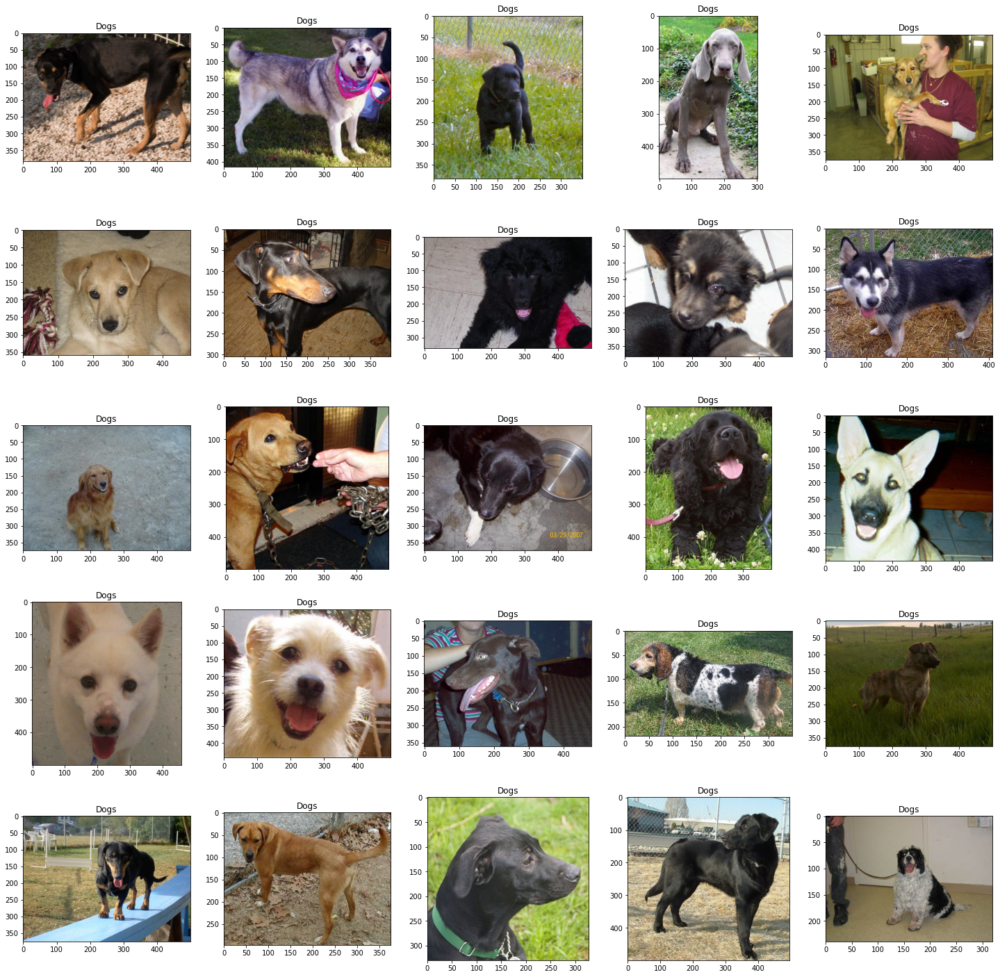

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')

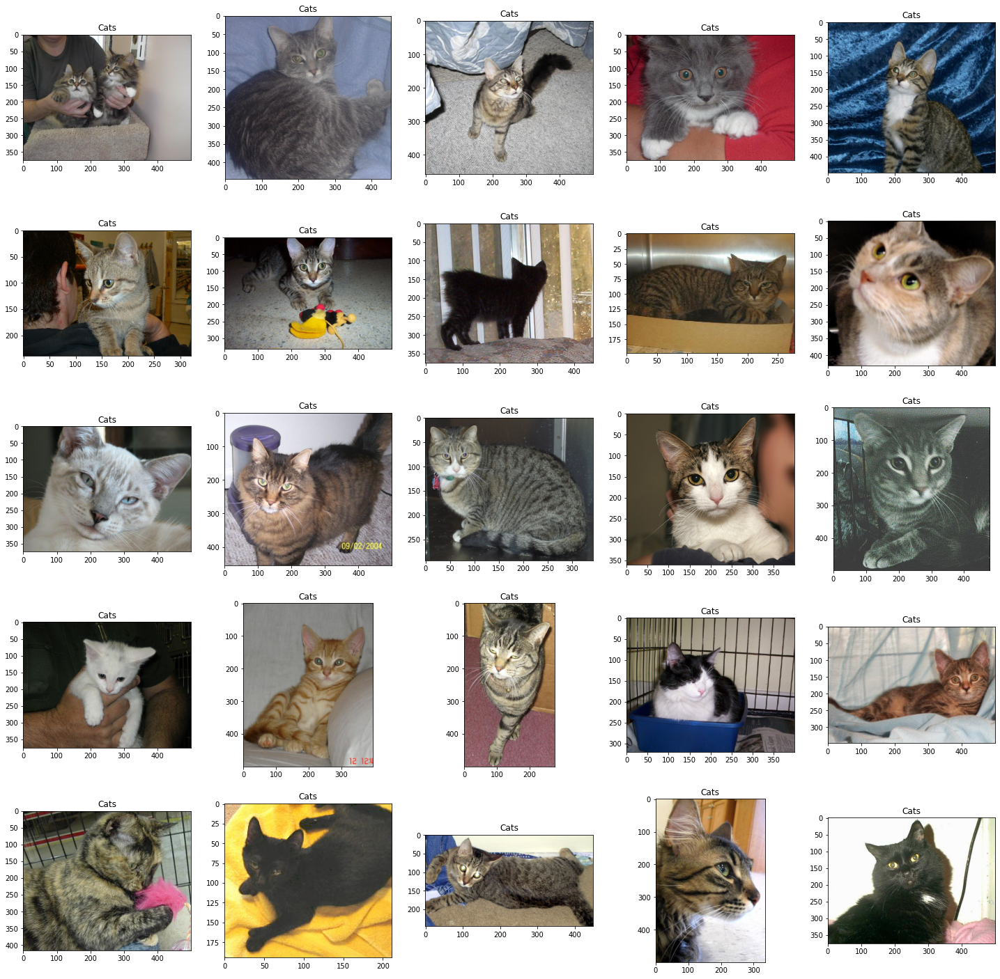

In [ ]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')

In [ ]:
t_img, label = train_data.next()

In [ ]:
t_img

array([[[[-8.22226048e-01, -8.22226048e-01, -9.16343689e-01],
         [-8.20784688e-01, -8.20784688e-01, -9.14902329e-01],
         [-8.05920064e-01, -8.03083658e-01, -9.02874172e-01],
         ...,
         [ 4.50980425e-01,  4.82352972e-01,  5.05882382e-01],
         [ 4.50980425e-01,  4.82352972e-01,  5.05882382e-01],
         [ 4.50980425e-01,  4.82352972e-01,  5.05882382e-01]],

        [[-8.22180986e-01, -8.22180986e-01, -9.16298628e-01],
         [-8.20942581e-01, -8.20942581e-01, -9.15060222e-01],
         [-8.05717051e-01, -8.02903175e-01, -9.02648568e-01],
         ...,
         [ 4.50980425e-01,  4.82352972e-01,  5.05882382e-01],
         [ 4.50980425e-01,  4.82352972e-01,  5.05882382e-01],
         [ 4.50980425e-01,  4.82352972e-01,  5.05882382e-01]],

        [[-8.22135866e-01, -8.22135866e-01, -9.16253507e-01],
         [-8.21100473e-01, -8.21100473e-01, -9.15218115e-01],
         [-8.05514097e-01, -8.02722752e-01, -9.02423024e-01],
         ...,
         [ 4.50980425e-0

In [ ]:
t_img.shape

(64, 256, 256, 3)

In [ ]:
def plotImages(img_arr, label):
  for idx, img in enumerate(img_arr):
    if idx <=10:
      plt.figure(figsize=(5,5))
      plt.imshow(img)
      plt.title(img.shape)
      plt.axis = False
      plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


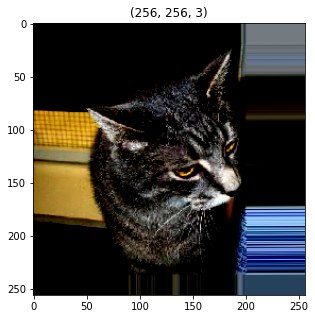

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


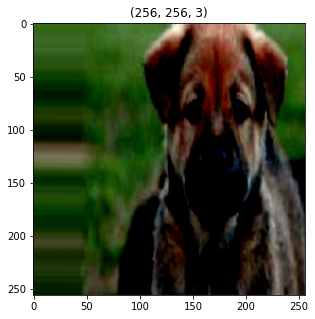

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


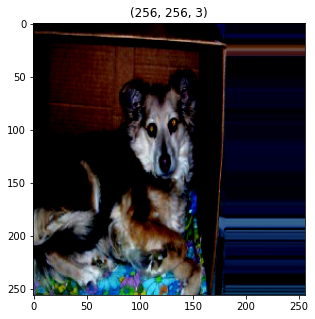

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


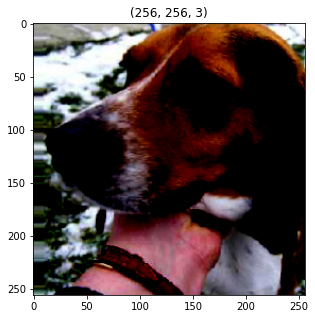

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


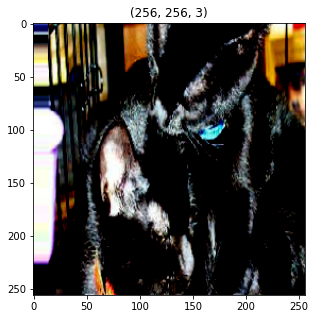

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


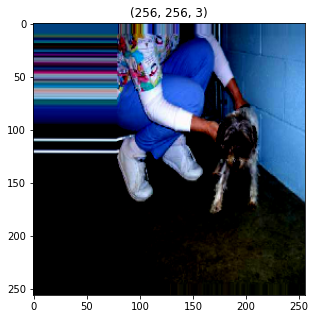

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


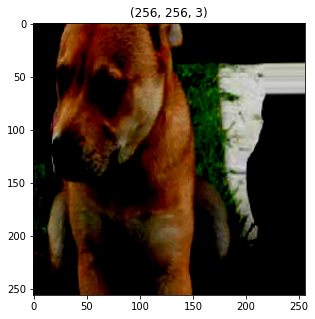

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


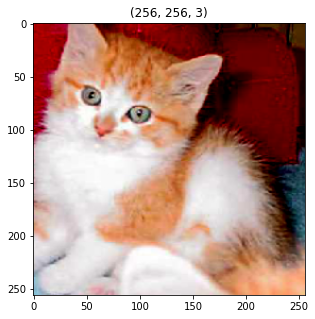

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


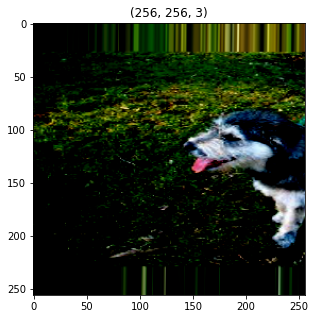

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


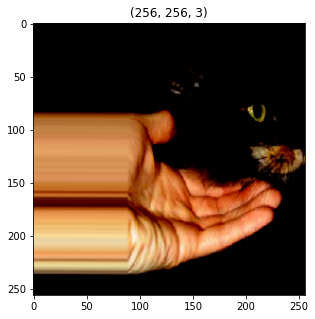

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


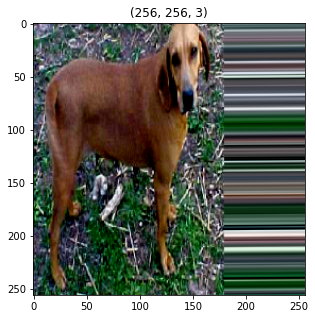

In [ ]:
plotImages(t_img, label)

### DataGenerator for the Images

In [ ]:
df['label'] = df['label'].astype('str')

In [ ]:
df.head()

,images,label
0,PetImages/Cat/2202.jpg,0
1,PetImages/Cat/10791.jpg,0
2,PetImages/Dog/2949.jpg,1
3,PetImages/Dog/6460.jpg,1
4,PetImages/Dog/6656.jpg,1


In [ ]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Building / Model Creation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from keras.layers import Dense, Flatten
from keras.models import Model
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import keras

In [ ]:
base_model = InceptionV3(input_shape=(256, 256, 3), include_top=False)

In [ ]:
for layer in base_model.layers:
  layer.trainable = False

In [ ]:
X = Flatten()(base_model.output)
X = Dense(units=2, activation='sigmoid')(X)

#Final Model
model = Model(base_model.input, X)
model.compile(optimizer='adam', loss = keras.losses.binary_crossentropy, metrics=['accuracy'])
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 127, 127, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 127, 127, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                           

In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

In [ ]:
model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_188 (Conv2D)         (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 63, 63, 16)       0         
 2D)                                                             
                                                                 
 conv2d_189 (Conv2D)         (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_190 (Conv2D)         (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 14, 14, 64)       0

In [ ]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 435s 11s/step - loss: 0.7221 - accuracy: 0.5634 - val_loss: 0.6239 - val_accuracy: 0.6512
Epoch 2/10
40/40 [==============================] - 467s 12s/step - loss: 0.6135 - accuracy: 0.6651 - val_loss: 0.6055 - val_accuracy: 0.6674
Epoch 3/10
40/40 [==============================] - 431s 11s/step - loss: 0.5665 - accuracy: 0.7034 - val_loss: 0.5325 - val_accuracy: 0.7322
Epoch 4/10
40/40 [==============================] - 432s 11s/step - loss: 0.5375 - accuracy: 0.7297 - val_loss: 0.5104 - val_accuracy: 0.7526
Epoch 5/10
40/40 [==============================] - 493s 12s/step - loss: 0.5231 - accuracy: 0.7377 - val_loss: 0.5029 - val_accuracy: 0.7540
Epoch 6/10
40/40 [==============================] - 424s 11s/step - loss: 0.5038 - accuracy: 0.7542 - val_loss: 0.5205 - val_accuracy: 0.7474
Epoch 7/10
40/40 [==============================] - 429s 11s/step - loss: 0.5028 - accuracy: 0.7550 - val_loss: 0.4677 - val_accuracy: 0.7812
Epoch 

###Pre-Process data using Data Generator

In [ ]:
train_datagen = ImageDataGenerator(featurewise_center=True, 
                                   rotation_range=0.4, width_shift_range=0.3, 
                                   horizontal_flip=True, 
                                   preprocessing_function=preprocess_input, 
                                   zoom_range=0.4, 
                                   shear_range=0.4, )

train_data = train_datagen.flow_from_directory(directory= '/content/DATASET', target_size=(256,256), batch_size=64)

Found 25000 images belonging to 2 classes.


In [ ]:
train_data.class_indices

{'cat': 0, 'dog': 1}

### Callbacks, Model Checkpoints and Tensorboard

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

mc = ModelCheckpoint(filepath="./best_model_h5",
                     monitor="accuracy",
                     verbose=1,
                     save_best_only=True)
es = EarlyStopping(monitor="accuracy", min_delta=0.01, patience=5, verbose=1)

cb = [mc,es]

In [ ]:
his = model.fit_generator(train_data, steps_per_epoch=10, epochs=30, callbacks=cb)

Epoch 1/30
10/10 [==============================] - ETA: 0s - loss: 0.3960 - accuracy: 0.9156 
Epoch 1: accuracy improved from -inf to 0.91562, saving model to ./best_model_h5
INFO:tensorflow:Assets written to: ./best_model_h5/assets
10/10 [==============================] - 149s 15s/step - loss: 0.3960 - accuracy: 0.9156
Epoch 2/30
10/10 [==============================] - ETA: 0s - loss: 0.1289 - accuracy: 0.9750 
Epoch 2: accuracy improved from 0.91562 to 0.97500, saving model to ./best_model_h5
INFO:tensorflow:Assets written to: ./best_model_h5/assets
10/10 [==============================] - 176s 18s/step - loss: 0.1289 - accuracy: 0.9750
Epoch 3/30
10/10 [==============================] - ETA: 0s - loss: 0.1802 - accuracy: 0.9828
Epoch 3: accuracy improved from 0.97500 to 0.98281, saving model to ./best_model_h5
INFO:tensorflow:Assets written to: ./best_model_h5/assets
10/10 [==============================] - 134s 14s/step - loss: 0.1802 - accuracy: 0.9828
Epoch 4/30
10/10 [========

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from matplotlib import pyplot as plt

In [ ]:
def preprocess(img, label):
    return tf.image.resize(img, [HEIGHT, WIDTH]) / 255, label

In [ ]:
HEIGHT = 200
WIDTH = 200
split = ['train[:70%]', 'train[70%:]']

In [ ]:
trainDataset, testDataset = tfds.load(name='cats_vs_dogs', split=split, as_supervised=True)
 
trainDataset = trainDataset.map(preprocess).batch(32)
testDataset = testDataset.map(preprocess).batch(32)

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(HEIGHT, WIDTH, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.Adam(0.001), 
              loss=tf.keras.losses.BinaryCrossentropy(), 
              metrics=[tf.keras.metrics.CategoricalAccuracy()])

In [ ]:
from google.colab import drive
import os
import datetime
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
!kill 386
%reload_ext tensorboard
!rm -rf ./logs/

/bin/bash: line 0: kill: (386) - No such process


In [ ]:
EPOCHS = 5
log_dir = "logs/fit/" + "cnn"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
%tensorboard --logdir logs/fit

hist = model.fit(trainDataset, 
                 epochs=EPOCHS, 
                 validation_data=testDataset, 
                 callbacks=[tensorboard_callback], verbose=1)

<IPython.core.display.Javascript object>

Epoch 1/5
509/509 [==============================] - 727s 1s/step - loss: 0.6289 - categorical_accuracy: 1.0000 - val_loss: 0.5459 - val_categorical_accuracy: 1.0000
Epoch 2/5
509/509 [==============================] - 711s 1s/step - loss: 0.5085 - categorical_accuracy: 1.0000 - val_loss: 0.4974 - val_categorical_accuracy: 1.0000
Epoch 3/5
509/509 [==============================] - 703s 1s/step - loss: 0.4204 - categorical_accuracy: 1.0000 - val_loss: 0.4975 - val_categorical_accuracy: 1.0000
Epoch 4/5
509/509 [==============================] - 711s 1s/step - loss: 0.3201 - categorical_accuracy: 1.0000 - val_loss: 0.5797 - val_categorical_accuracy: 1.0000
Epoch 5/5
509/509 [==============================] - 703s 1s/step - loss: 0.2262 - categorical_accuracy: 1.0000 - val_loss: 0.7160 - val_categorical_accuracy: 1.0000


In [ ]:
from keras.models import load_model

model = load_model('/content/best_model_h5')


In [ ]:
h = his.history
h.keys()

dict_keys(['loss', 'accuracy'])

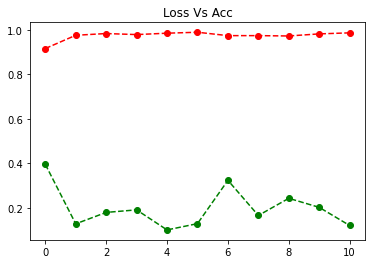

In [ ]:
plt.plot(h['loss'], 'go--')
plt.plot(h['accuracy'], 'go--', c="red",)
plt.title("Loss Vs Acc")
plt.show()

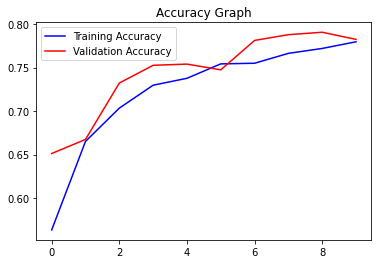

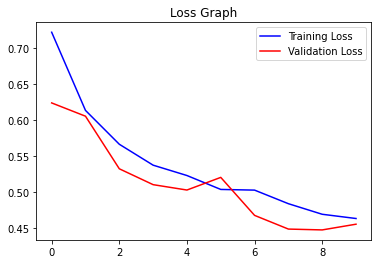

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

### Validate Model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The image is dog


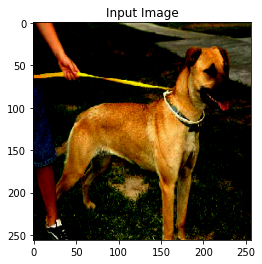

In [ ]:
path = "/content/test1/1003.jpg"
img = load_img(path, target_size=(256,256))
i = img_to_array(img)
i = preprocess_input(i)
input_arr = np.array([i])
input_arr.shape

pred = np.argmax(model.predict(input_arr))

if pred == 0:
  print("The image is cat")
else:
  print("The image is dog")

plt.imshow(input_arr[0])
plt.title("Input Image")
plt.axis = False
plt.show()